
# PyPSA-Eur Power Model Validation Notebook for Ember Project

This notebook aims to check and validate outputs from the **PyPSA-Eur power model** for the **Ember project**, focusing on the following countries:

- Germany (DE)  
- Netherlands (NL)  
- Italy (IT)  
- Poland (PL)  
- Czech Republic (CZ)  
- Greece (GR)

The notebook performs validation for the following:

- Power flows (compared to ENTSO-E data)  
- Generation dispatch  
- Installed capacity per country  
- Energy demand per country  
- Geographic plots of installed capacities  

---

### Steps to Run This Notebook

#### Step 1: Fork the Ember-Flexibility-Study Repository

Visit the GitHub repository and fork it to your account:  
🔗 https://github.com/open-energy-transition/Ember-Flexibility-Study

---

#### Step 2: Clone the Repository Locally

Clone the forked repository to your local machine using the following command in your terminal:

```bash
git clone https://github.com/open-energy-transition/Ember-Flexibility-Study
```

This will download the repository into your preferred directory.

---

#### Step 3: Copy the `config.yaml` File

Ensure that the `config.yaml` file (which contains model configurations needed to generate results) is copied into the `config/` folder of the repository.

---

#### Step 4: Activate the PyPSA-Eur Conda Environment

If you're using Conda, activate the PyPSA-Eur environment with the following command in your terminal:

```bash
conda activate pypsa-eur
```

Make sure you have the environment installed. If not, follow instructions in the PyPSA-Eur documentation to set it up.

---

#### Step 5: Run the Electricity Model Using Gurobi

If you have Gurobi installed and a valid license, run the electricity model using the following command in your terminal:

```bash
snakemake --scheduler-ilp-solver GUROBI_CMD --cores 1 -call solve_elec_networks
```

This command will run the model and generate a solved network file (in `.nc` format) under the `results/network/` folder.

---

#### Step 6: Load the Network in Your Notebook

After running the model, open the validation notebook in your preferred Jupyter environment. Load the network by adding and running the appropriate code to read the generated `.nc` file in a notebook cell.

---

#### Step 7: Run All Notebook Cells

Once the network is loaded, execute all the cells in the notebook to perform the following tasks:

- Visualize power flows between countries  
- Check generation dispatch per country  
- Validate installed capacities  
- Compare energy demand per country  
- Plot installed capacities on maps


## Preparation

### Import Packages

In [1]:
import logging
import os

import pypsa
import yaml
import pandas as pd
import geopandas as gpd
import numpy as np
import scipy as sp
import networkx as nx


# plotting stuff
import matplotlib.pyplot as plt

plt.style.use("bmh")
import seaborn as sns  ###
import cartopy.crs as ccrs

sns.set(style="darkgrid")

from scipy.sparse import csgraph
from itertools import product

from shapely.geometry import Point, LineString
import shapely, shapely.prepared, shapely.wkt

logger = logging.getLogger(__name__)

pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", 70)

# change current directory to parent folder
import os
import sys



# plotting settings
max_node_size = 1.0  # maximum size of a node for plotting purposes [used in plots]

## Loading the solved network

In [3]:
n=pypsa.Network("C:\\Users\\user\\Desktop\\Ember-Flexibility-Study\\results\\networks\\base_s_39_elec_.nc")

INFO:pypsa.io:Imported network base_s_39_elec_.nc has buses, carriers, generators, lines, links, loads, storage_units


## Country-Level Dispatch and Capacity Analysis

This section defines a function `plot_dispatch_and_capacity_per_country(n, time="2013-10-09")` that visualizes two key aspects of the power system model for the six focus countries (DE, NL, IT, PL, CZ, GR):

1. **Hourly Power Dispatch**:  
   - Plotted in a 3x2 grid (one subplot per country)
   - Shows generation per carrier, storage dispatch, net imports, and load profiles
   - Helps validate model behavior and generation mix at a specific hour or date

2. **Total Installed Capacity per Carrier and Country**:  
   - Presented as a separate stacked bar chart
   - Displays total installed capacity (in GW) by generation/storage technology and country

---

### What the Code Does – Step-by-Step Explanation

#### Input Validation
- Checks that the input `n` is a valid PyPSA network object.
- Confirms required time series attributes (`generators_t`, `storage_units_t`, etc.) are available.

#### Country Loop
Iterates over the six selected countries:
- Filters generators and storage units connected to each country’s buses.
- Aggregates installed capacity per carrier.
- For the selected `time`, retrieves:
  - **Generator dispatch** (in GW)
  - **Storage dispatch** (if available)
  - **Net imports** (power flowing into the country)
  - **Load profile** (consumer demand)

#### Dispatch Plot
- Generates area plots per country:
  - Positive values: Generation and imports
  - Negative values: Charging (for storage)
  - Load profile overlaid as a black line
- Enhances readability with spacing, consistent coloring (based on carrier color), and labeled legends.

#### Capacity Plot
- Builds a separate bar chart summarizing installed capacity per country and carrier.
- Filters out carriers with zero capacity.
- Uses consistent coloring with dispatch plots for easier comparison.

#### Outputs
- Saves two images:
  - `dispatch_per_country.png`
  - `capacity_per_country.png`
- These can be used for inclusion in validation reports or presentations.

---

### Example Code Block to Run

```python
# Load the solved network before calling this
n = pypsa.Network("results/network/<your_network_file>.nc")
plot_dispatch_and_capacity_per_country(n, time="2013-10-09")


C:\Users\user\AppData\Local\Temp\ipykernel_18164\984154544.py:63: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  gens_t = n.generators_t.p.loc[time][gens.index].groupby(gens.carrier, axis=1).sum().div(1e3)  # GW
C:\Users\user\AppData\Local\Temp\ipykernel_18164\984154544.py:63: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  gens_t = n.generators_t.p.loc[time][gens.index].groupby(gens.carrier, axis=1).sum().div(1e3)  # GW
C:\Users\user\AppData\Local\Temp\ipykernel_18164\984154544.py:63: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  gens_t = n.generators_t.p.loc[time][gens.index].groupby(gens.carrier, axis=1).sum().div(1e3)  # GW
C:\Users\user\AppData\Local\Temp\ipykernel_18164\984154544.py:63: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
 

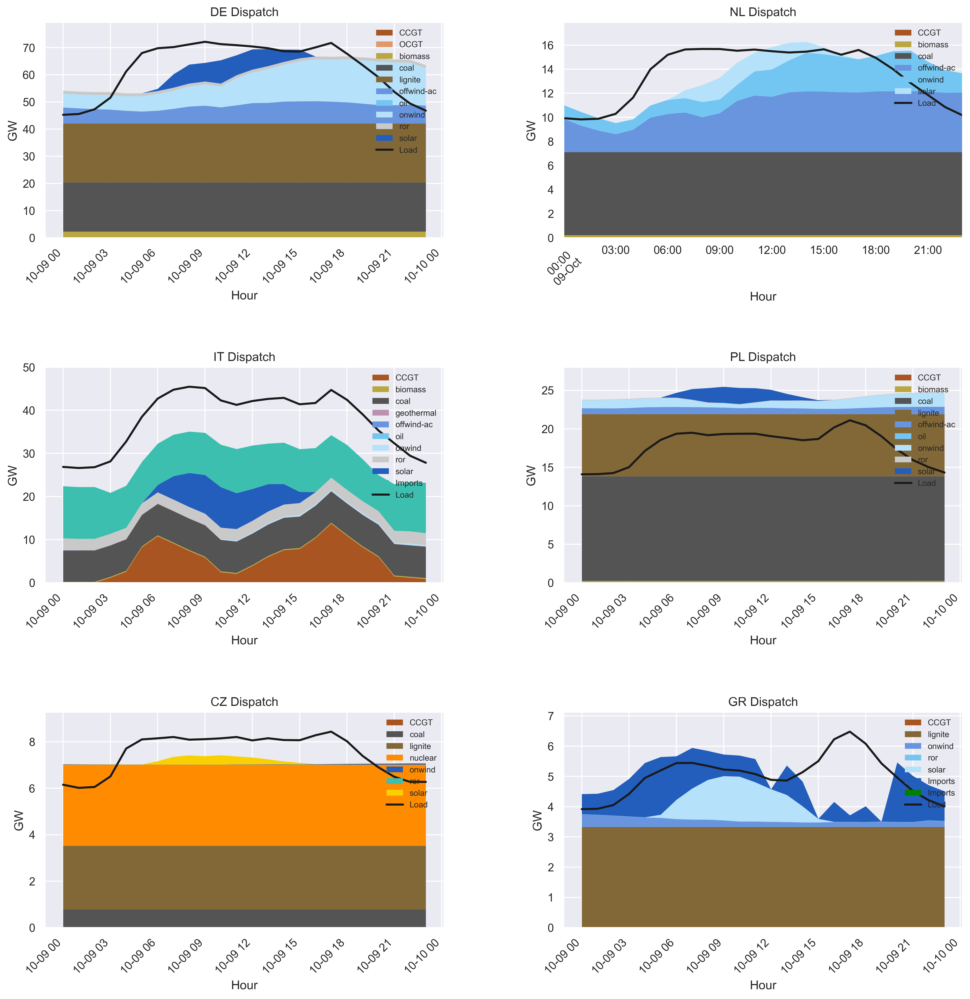

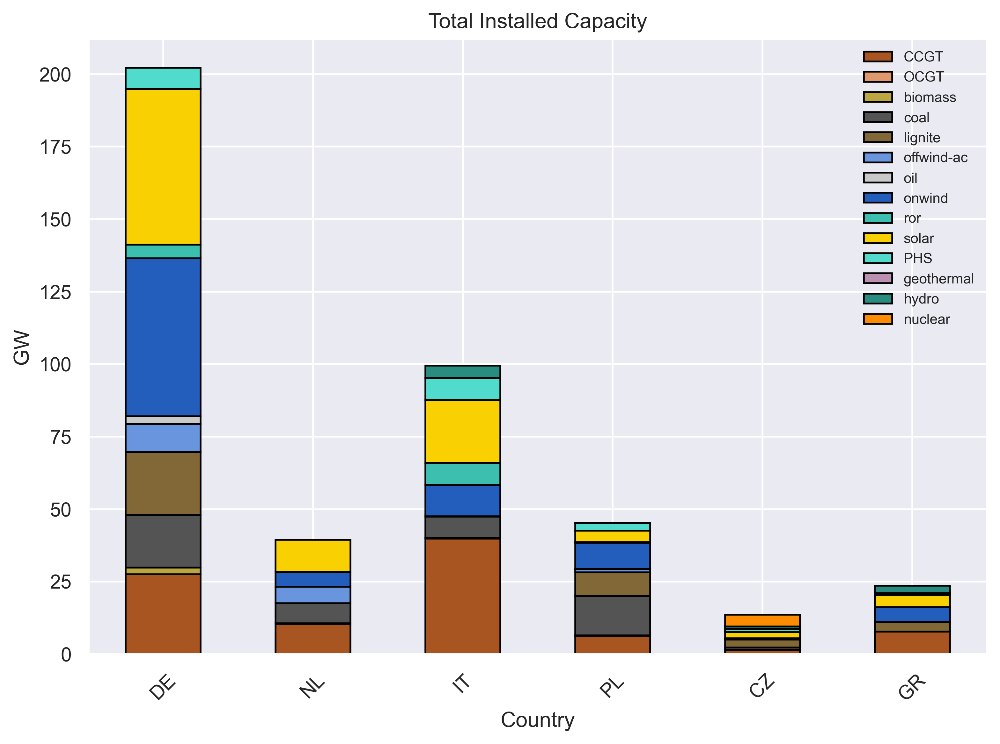

In [4]:
def plot_dispatch_and_capacity_per_country(n, time="2013-10-09"):
    """
    Plot dispatch (generation, storage, imports, and load) for focus countries in a 3x2 grid
    with increased row spacing, larger subplots, and visible load profiles, and total installed
    capacity in a separate figure.
    
    Parameters:
    - n: PyPSA network object
    - time: Date string (e.g., "2013-10-09") for dispatch plot
    """
    # Input validation
    if not isinstance(n, pypsa.Network):
        raise TypeError("Input 'n' must be a PyPSA Network object.")
    if not all(hasattr(n, attr) for attr in ['generators_t', 'storage_units_t', 'loads_t', 'lines_t']):
        raise ValueError("Network missing required attributes: generators_t, storage_units_t, loads_t, or lines_t")
    
    # Define focus countries
    focus_countries = ['DE', 'NL', 'IT', 'PL', 'CZ', 'GR']
    
    # Function to get country code from bus
    def get_country(bus):
        return bus[:2] if isinstance(bus, str) and len(bus) >= 2 else None
    
    # Function to calculate net imports (from power_flow_analysis_with_comparison.py)
    def get_net_import(n, country, snapshots):
        net_import = pd.Series(0.0, index=snapshots)
        for line in n.lines.index:
            bus0_country = get_country(n.lines.loc[line, 'bus0'])
            bus1_country = get_country(n.lines.loc[line, 'bus1'])
            if bus0_country == country and bus1_country != country:
                net_import += n.lines_t.p0[line]  # Positive flow from bus0 to bus1 (export)
            elif bus1_country == country and bus0_country != country:
                net_import += -n.lines_t.p0[line]  # Negative flow to bus1 (import)
        return -net_import  # Invert to get imports (positive) and exports (negative)
    
    # --- Dispatch Figure ---
    # Create figure with 3x2 grid for dispatch plots, increased spacing and size
    fig_dispatch, axes_dispatch = plt.subplots(
        3, 2, figsize=(16, 18), gridspec_kw={'wspace': 0.3, 'hspace': 0.6}
    )
    dispatch_axes = axes_dispatch.flatten()  # Flatten to iterate over all 6 subplots
    
    # Dictionary to store capacity data
    capacity_data = {country: {} for country in focus_countries}
    
    # Plot dispatch for each focus country
    for idx, country in enumerate(focus_countries):
        ax = dispatch_axes[idx]
        
        # Filter generators and storage units for the country
        gens = n.generators[n.generators.bus.map(get_country) == country]
        p_by_carrier = gens.groupby('carrier').p_nom.sum().div(1e3)  # Installed capacity in GW
        for carrier in p_by_carrier.index:
            capacity_data[country][carrier] = capacity_data[country].get(carrier, 0) + p_by_carrier[carrier]
        
        if not n.storage_units.empty:
            storages = n.storage_units[n.storage_units.bus.map(get_country) == country]
            sto_p_nom = storages.groupby('carrier').p_nom.sum().div(1e3)  # Installed capacity in GW
            for carrier in sto_p_nom.index:
                capacity_data[country][carrier] = capacity_data[country].get(carrier, 0) + sto_p_nom[carrier]
        
        # Get dispatch data (absolute values)
        gens_t = n.generators_t.p.loc[time][gens.index].groupby(gens.carrier, axis=1).sum().div(1e3)  # GW
        gens_t = np.abs(gens_t)  # Use absolute values
        p_by_carrier = gens_t
        
        if not n.storage_units.empty and not storages.empty:
            sto_t = n.storage_units_t.p.loc[time][storages.index].groupby(storages.carrier).sum().div(1e3)  # GW
            sto_t = np.abs(sto_t)  # Use absolute values
            p_by_carrier = pd.concat([p_by_carrier, sto_t], axis=1)
        
        # Get net imports for the country
        snapshots = n.snapshots[n.snapshots.slice_indexer(time, time)]
        net_imports = get_net_import(n, country, snapshots).div(1e3)  # GW
        if not net_imports.empty:
            p_by_carrier['Imports'] = net_imports
        
        # Handle colors, assigning gray for undefined carriers and green for imports
        default_color = 'gray'
        color_map = n.carriers.color.fillna(default_color).to_dict()
        color_map['Imports'] = 'green'  # Green for imports
        color = p_by_carrier.columns.map(lambda x: color_map.get(x, default_color))
        
        # Filter out columns with all zero or NaN
        p_by_carrier = p_by_carrier.loc[:, p_by_carrier.sum() > 0]
        if p_by_carrier.empty:
            ax.text(0.5, 0.5, 'No Dispatch Data', ha='center', va='center')
            ax.set_title(f'{country} Dispatch')
            ax.set_ylabel('GW')
            ax.set_xlabel('Hour')
            continue
        
        # Plot positive dispatch (generation and imports)
        p_by_carrier.where(p_by_carrier > 0).plot.area(
            ax=ax,
            linewidth=0,
            color=color,
        )
        
        # Plot negative dispatch (charging, if any)
        charge = p_by_carrier.where(p_by_carrier < 0).dropna(how="all", axis=1)
        if not charge.empty:
            charge_color = charge.columns.map(lambda x: color_map.get(x, default_color))
            charge.plot.area(
                ax=ax,
                linewidth=0,
                color=charge_color,
            )
        
        # Plot load
        loads = n.loads[n.loads.bus.map(get_country) == country]
        if loads.empty:
            print(f"No loads found for {country}. Available buses: {n.loads.bus.unique()}")
            ax.text(0.5, 0.4, 'No Load Data', ha='center', va='center', fontsize=8)
        else:
            load_data = n.loads_t.p_set.loc[time][loads.index].sum(axis=1).div(1e3)  # GW
            if load_data.empty or load_data.sum() == 0:
                print(f"Empty or zero load data for {country}. Load indices: {loads.index}")
                ax.text(0.5, 0.4, 'No Load Data', ha='center', va='center', fontsize=8)
            else:
                load_data.plot(ax=ax, c="k", label='Load', linewidth=2)
        
        # Adjust y-axis to ensure load is visible
        max_load = load_data.max() if not load_data.empty else 0
        max_dispatch = p_by_carrier.where(p_by_carrier > 0).sum(axis=1).max() if not p_by_carrier.empty else 0
        max_y = max(max_load, max_dispatch) * 1.1  # 10% buffer
        ax.set_ylim(0, max_y if max_y > 0 else 1)  # Avoid zero limit
        
        ax.set_title(f'{country} Dispatch')
        ax.set_ylabel('GW')
        ax.set_xlabel('Hour')
        ax.legend(loc='upper right', fontsize=8)
        ax.tick_params(axis='x', rotation=45)
    
    # Save dispatch figure
    plt.tight_layout()
    plt.savefig('dispatch_per_country.png', bbox_inches='tight')
    plt.show()
    
    # --- Capacity Figure ---
    # Create separate figure for total installed capacity
    fig_capacity, capacity_ax = plt.subplots(figsize=(8, 6))
    
    # Plot total installed capacity
    capacity_df = pd.DataFrame(capacity_data).fillna(0)
    capacity_df = capacity_df.loc[capacity_df.sum(axis=1) > 0]
    if not capacity_df.empty:
        color = capacity_df.index.map(lambda x: n.carriers.color.get(x, default_color))
        capacity_df.T.plot.bar(
            ax=capacity_ax,
            stacked=True,
            color=color,
            edgecolor='black'
        )
        capacity_ax.set_title('Total Installed Capacity')
        capacity_ax.set_ylabel('GW')
        capacity_ax.set_xlabel('Country')
        capacity_ax.legend(loc='upper right', fontsize=8)
        capacity_ax.tick_params(axis='x', rotation=45)
    else:
        capacity_ax.text(0.5, 0.5, 'No Capacity Data', ha='center', va='center')
        capacity_ax.set_title('Total Installed Capacity')
        capacity_ax.set_ylabel('GW')
        capacity_ax.set_xlabel('Country')
    
    # Save capacity figure
    plt.tight_layout()
    plt.savefig('capacity_per_country.png', bbox_inches='tight')
    plt.show()

# Example usage:
# n = pypsa.Network("path/to/pypsa-eur-network.nc")
plot_dispatch_and_capacity_per_country(n, time="2013-10-09")

## Total Annual Electricity Demand by Country

This section defines a function `plot_total_demand_per_country(n)` that calculates and visualizes the **total annual electricity demand** for each of the six focus countries. The output is presented in **terawatt-hours (TWh)** and displayed as a bar chart.

---

### What the Code Does – Step-by-Step Explanation

#### Input
- `n`: A PyPSA `Network` object containing time series data for electricity loads across all buses.

#### Focus Countries
- The function focuses on:
  - Germany (DE)
  - Netherlands (NL)
  - Italy (IT)
  - Poland (PL)
  - Czech Republic (CZ)
  - Greece (GR)

#### Demand Calculation Steps

1. **Extract Loads for Each Country**:
   - For each country, buses are filtered based on their 2-letter prefix (e.g., `"DE"`).
   - Loads connected to these buses are selected.

2. **Sum Time Series Data**:
   - For each load in the selected country, the hourly demand (in MWh) is summed across the entire year.
   - The result is total electricity demand in **TWh** (`1 TWh = 1,000,000 MWh`).

3. **Handle Missing or Zero Data**:
   - If no load data is found or it's all zero, the function logs a message and sets the demand to 0 for that country.

4. **Create a Bar Chart**:
   - A single bar is plotted per country.
   - The bars show the total annual demand in TWh.
   - Each bar is labeled with the numeric value (e.g., 350.2 TWh).

---

### Output
- A saved figure: `total_demand_per_country.png`
- A bar chart comparing **total annual demand** per country.

---

### Example Usage

```python
# Load the solved network first
n = pypsa.Network("results/network/elec_s_2024.nc")
plot_total_demand_per_country(n)


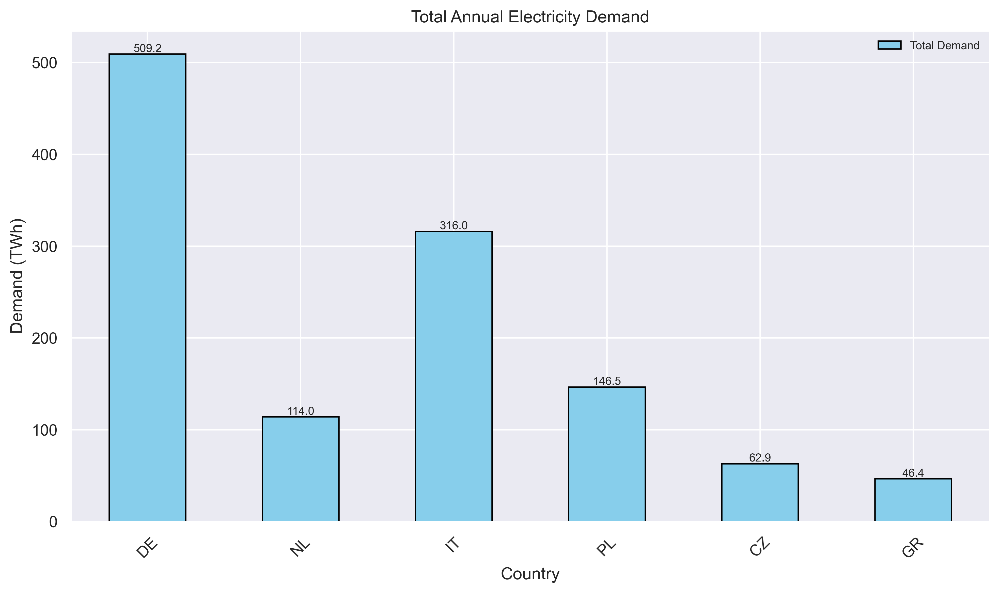

In [6]:
def plot_total_demand_per_country(n):
    """
    Plot total annual electricity demand (2024) in TWh for focus countries.
    
    Parameters:
    - n: PyPSA network object
    """
    # Define focus countries
    focus_countries = ['DE', 'NL', 'IT', 'PL', 'CZ', 'GR']
    
    # Function to get country code from bus
    def get_country(bus):
        return bus[:2] if isinstance(bus, str) and len(bus) >= 2 else None
    
    # Initialize dictionary to store demand data
    demand_data = {country: {} for country in focus_countries}
    
    # Aggregate demand by country
    for country in focus_countries:
        # Filter loads for the country
        loads = n.loads[n.loads.bus.map(get_country) == country]
        if loads.empty:
            print(f"No loads found for {country}. Available buses: {n.loads.bus.unique()}")
            demand_data[country]['Total'] = 0
            continue
        
        # Sum hourly demand (MWh) over the year for each load
        load_demand = n.loads_t.p_set[loads.index].sum()  # MWh
        if load_demand.empty or load_demand.sum() == 0:
            print(f"Empty or zero load data for {country}. Load indices: {loads.index}")
            demand_data[country]['Total'] = 0
            continue
        
        # Convert to TWh (1 TWh = 1e6 MWh) and sum for the country
        total_demand_twh = load_demand.sum() / 1e6  # TWh
        demand_data[country]['Total'] = total_demand_twh
    
    # Create DataFrame from demand data
    demand_df = pd.DataFrame(demand_data).fillna(0)
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(10, 6))
    demand_df.T.plot.bar(
        ax=ax,
        stacked=True,
        color='skyblue',  # Single color for total demand (no carrier types)
        edgecolor='black'
    )
    
    ax.set_title('Total Annual Electricity Demand')
    ax.set_ylabel('Demand (TWh)')
    ax.set_xlabel('Country')
    ax.legend(['Total Demand'], loc='upper right', fontsize=8)
    ax.tick_params(axis='x', rotation=45)
    
    # Add value labels on top of bars
    for i, country in enumerate(demand_df.columns):
        total = demand_df[country].sum()
        if total > 0:
            ax.text(i, total, f'{total:.1f}', ha='center', va='bottom', fontsize=8)
    
    # Adjust layout and save
    plt.tight_layout()
    plt.savefig('total_demand_per_country.png', bbox_inches='tight')
    plt.show()


plot_total_demand_per_country(n)


## Power Flow Comparison: PyPSA-Eur vs ENTSO-E 2024

To compare physical power flows from the **PyPSA-Eur model** with the official **ENTSO-E 2024 dataset**, we start by setting a consistent visual style using Matplotlib’s `ggplot` theme. This ensures that all plots are visually coherent and maintain a clean appearance throughout the analysis.

We define a list of transmission line connections, where each line connects two countries via specific buses in the PyPSA-Eur model. Using this, a dictionary (`connection_map`) is constructed to map each line ID to a country-pair format (e.g., `DE-PL`). This facilitates easy identification of cross-border connections in both modeled and observed datasets.

The ENTSO-E 2024 dataset is loaded and filtered to retain only monthly values. We narrow the scope to flows involving our focus countries: **Germany (DE), Netherlands (NL), Italy (IT), Poland (PL), Czech Republic (CZ), and Greece (GR)**. For each month and country pair, we compute the average of the **absolute power flows**, capturing the magnitude of exchange regardless of direction.

From the PyPSA-Eur side, all line power flows (`lines_t.p0`) are reshaped into long format and mapped to country-pair connections using the earlier dictionary. The full time-series dataset is exported to Excel for future reference.

We identify and extract power flows for all transmission lines connected to the focus countries. These lines are validated against the time-series dataset, and their hourly flow data is saved separately. To provide more granularity, we extract and store power flow data for each individual focus country, capturing the behavior of all interconnections involving that country.

To align the resolution of PyPSA-Eur outputs with the ENTSO-E data, the absolute hourly power flows are aggregated into **monthly averages** per connection. This allows for a **direct comparison** between modeled and observed data.

The datasets from ENTSO-E and PyPSA-Eur are then merged on `Connection` and `Month`, and the difference in average flows is calculated. For each connection, a comparison plot is generated showing the monthly average absolute power flows from both sources, allowing for visual inspection of consistency and deviations.

For insight into **intra-day variation**, a snapshot of absolute power flows for a single day (e.g., `2013-01-03`) is plotted. This highlights the daily operational dynamics across the focus interconnectors. If data for the selected date is missing, the first 24 time steps of the model are used as a fallback.

To provide an overall summary, we compute the **annual average absolute power flow** for each focus line and visualize these in a bar chart. This identifies the most active interconnections in the modeled European network.

Lastly, we calculate the **net export** for each focus country by summing all directional flows through cross-border lines. Exports and imports are treated with opposite signs, and the resulting time series is saved to Excel. The average net export (in MW) is printed per country, revealing its typical import/export role in the system.


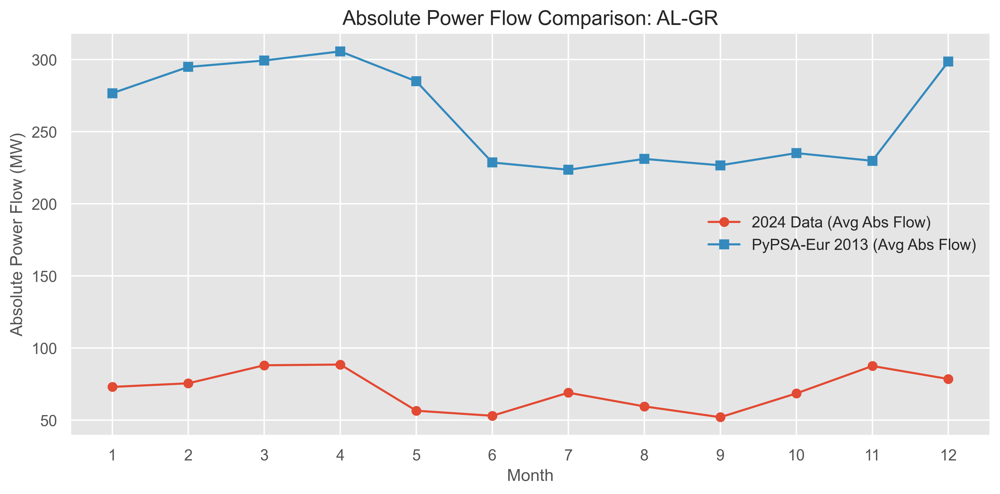

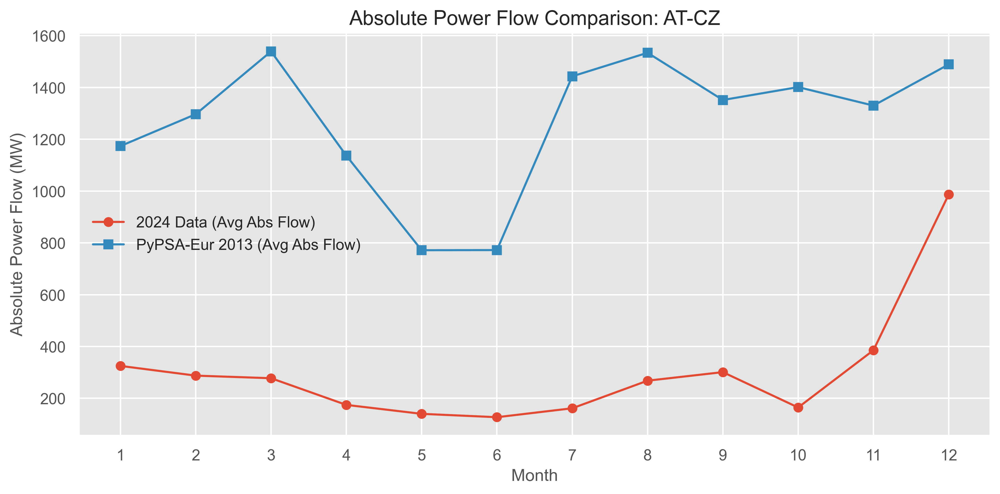

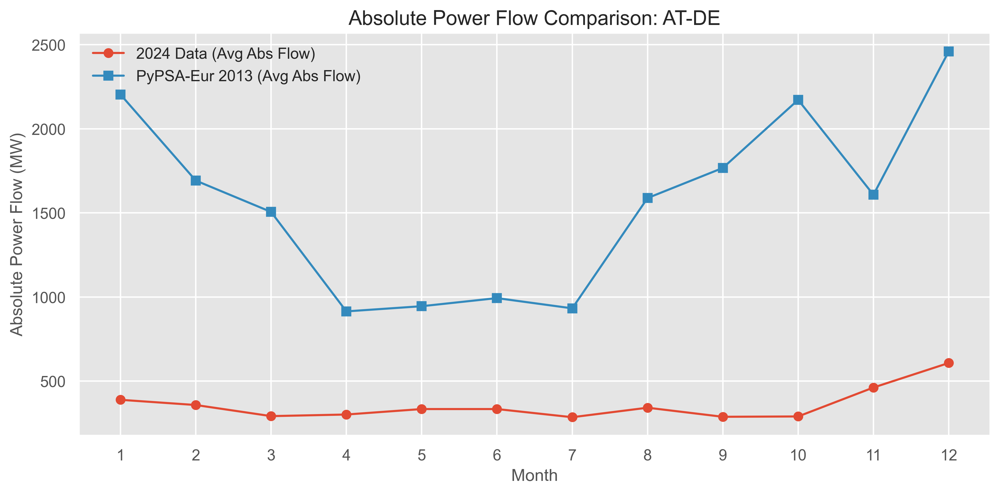

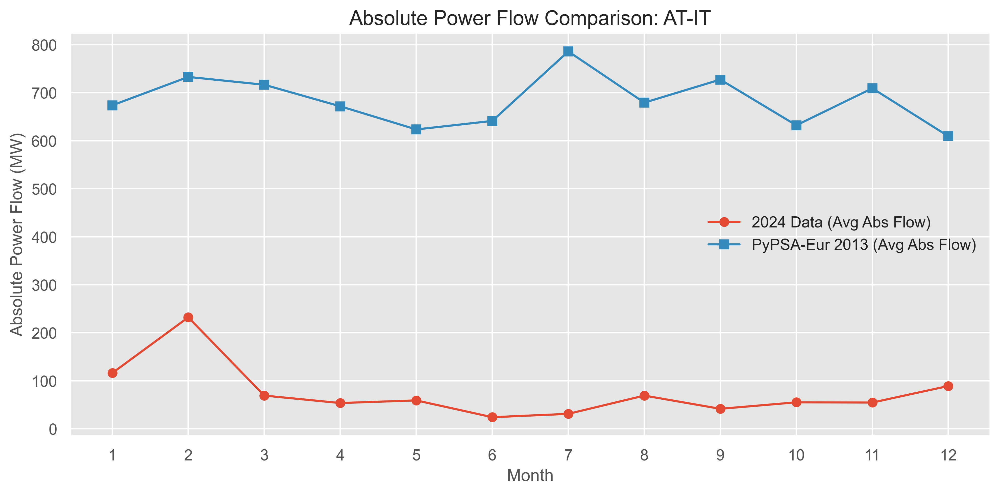

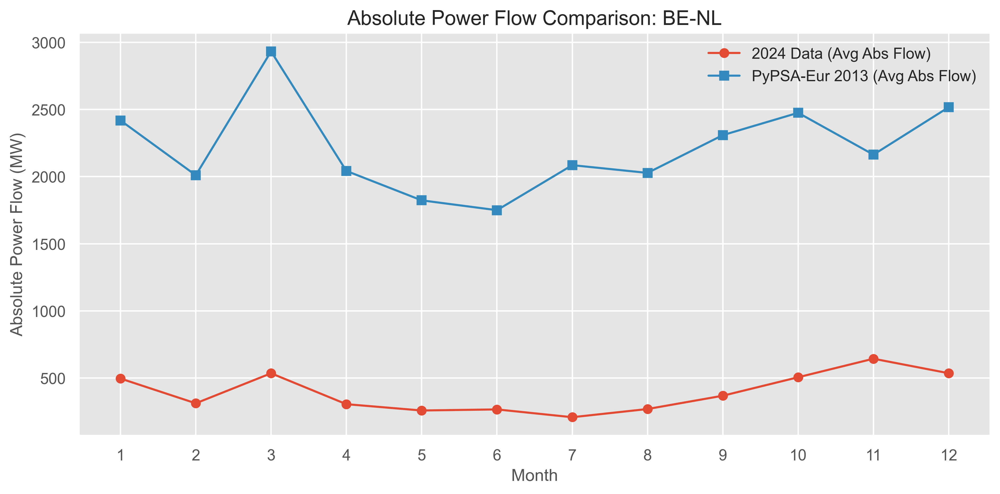

...

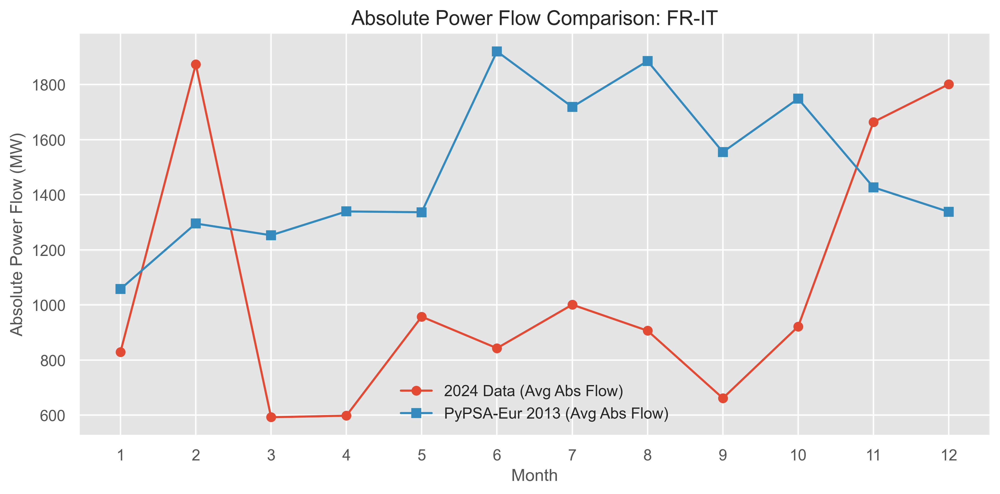

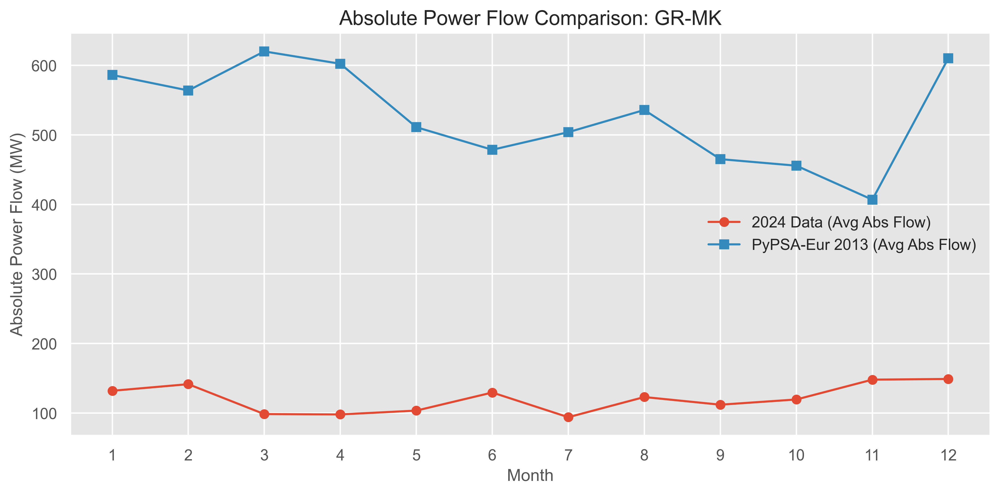

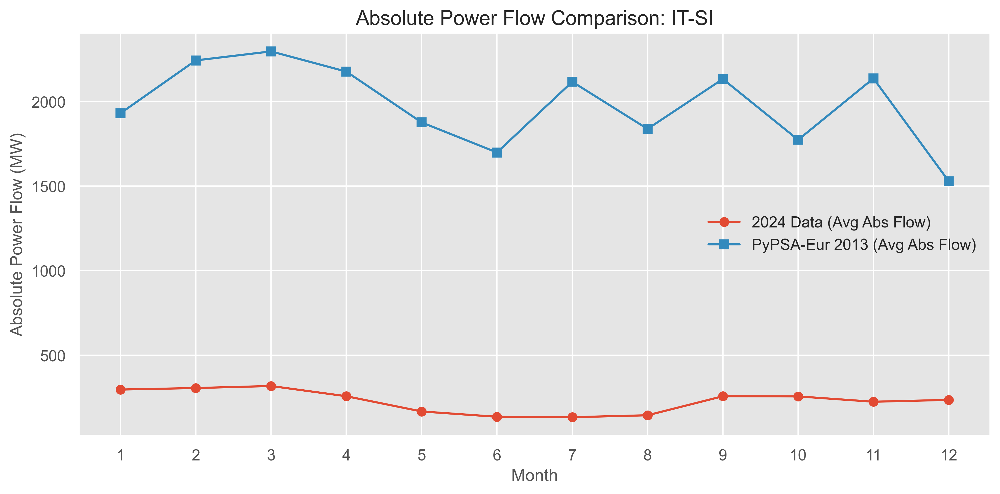

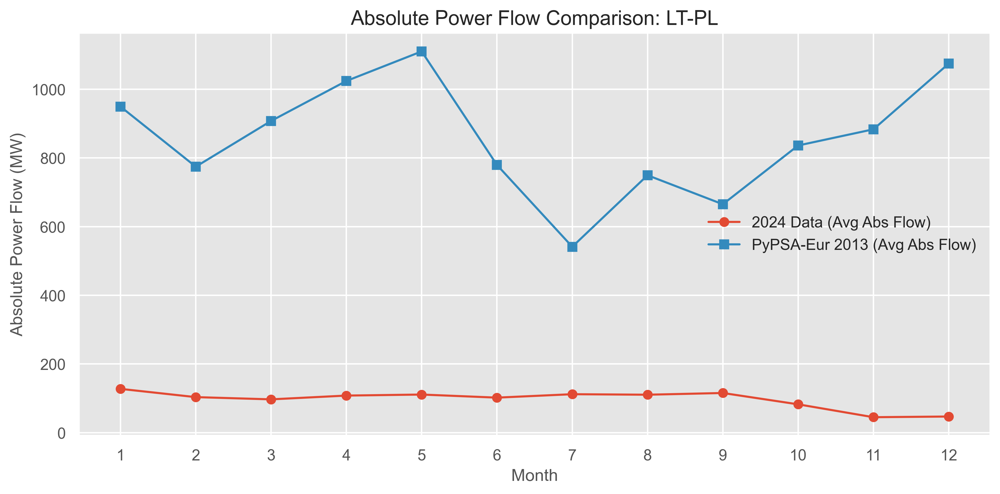

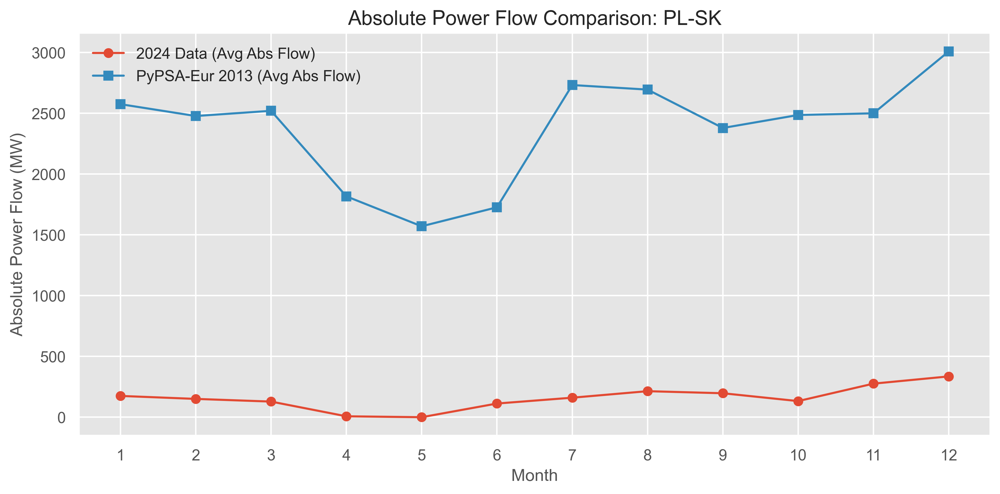

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

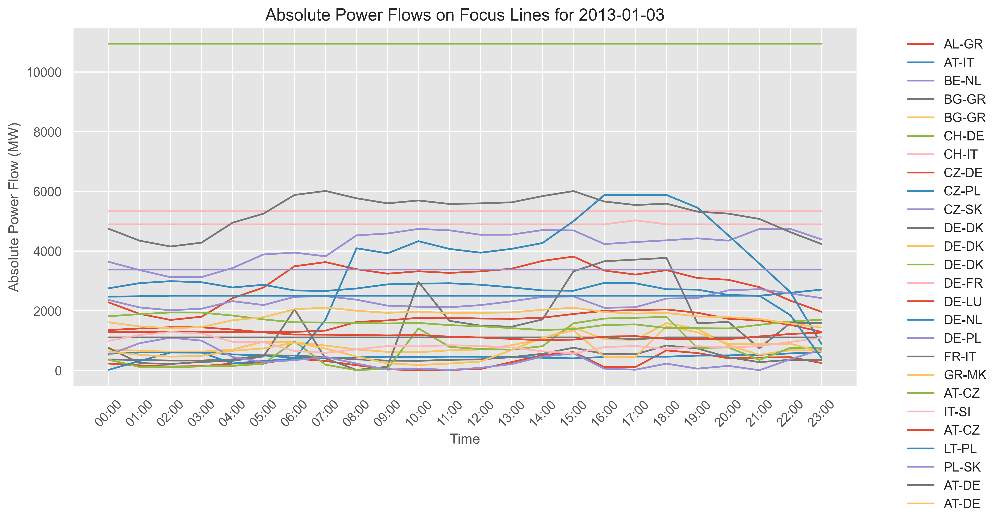

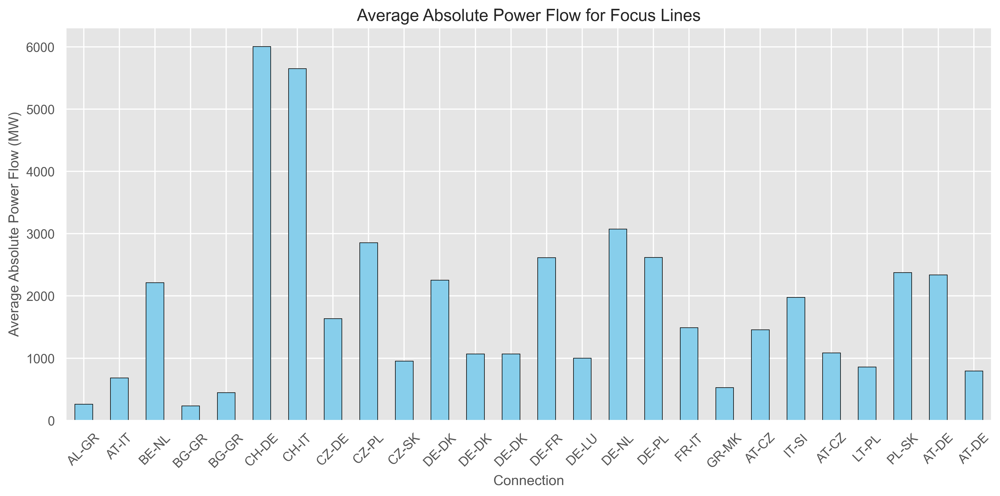

Average net export for PL: 7926.73630144031 MW
Average net export for IT: -9770.824752591767 MW
Average net export for CZ: 619.8981715402981 MW
Average net export for DE: 6908.649062857333 MW
Average net export for GR: -166.5998207884796 MW
Average net export for NL: -128.16758655777045 MW


In [7]:
# Set Matplotlib style for better visuals
plt.style.use('ggplot')


line_connections = [
    ('0', 'AL0 0', 'GR0 0'), ('1', 'AL0 0', 'ME0 0'), ('10', 'AT0 0', 'IT0 0'), ('11', 'AT0 0', 'SI0 0'),
    ('12', 'BA0 0', 'HR0 0'), ('13', 'BA0 0', 'ME0 0'), ('14', 'BA0 0', 'RS0 0'), ('15', 'BA0 0', 'RS0 0'),
    ('16', 'BE0 0', 'FR0 0'), ('17', 'BE0 0', 'LU0 0'), ('18', 'BE0 0', 'NL0 0'), ('19', 'BG0 0', 'GR0 0'),
    ('2', 'AL0 0', 'MK0 0'), ('20', 'BG0 0', 'GR0 0'), ('21', 'BG0 0', 'MK0 0'), ('22', 'BG0 0', 'RO0 0'),
    ('23', 'BG0 0', 'RS0 0'), ('24', 'CH0 0', 'DE0 0'), ('25', 'CH0 0', 'FR0 0'), ('26', 'CH0 0', 'IT0 0'),
    ('27', 'CZ0 0', 'DE0 0'), ('28', 'CZ0 0', 'PL0 0'), ('29', 'CZ0 0', 'SK0 0'), ('3', 'AL0 0', 'XK0 0'),
    ('30', 'DE0 0', 'DK0 0'), ('31', 'DE0 0', 'DK0 0'), ('32', 'DE0 0', 'DK0 0'), ('33', 'DE0 0', 'FR0 0'),
    ('34', 'DE0 0', 'LU0 0'), ('35', 'DE0 0', 'NL0 0'), ('36', 'DE0 0', 'PL0 0'), ('37', 'DK1 0', 'SE1 0'),
    ('38', 'EE0 0', 'LV0 0'), ('39', 'ES0 0', 'FR0 0'), ('4', 'AT0 0', 'CH0 0'), ('40', 'ES0 0', 'PT0 0'),
    ('41', 'ES0 0', 'PT0 0'), ('42', 'FI1 0', 'NO1 0'), ('43', 'FI1 0', 'SE1 0'), ('44', 'FI1 0', 'SE1 0'),
    ('45', 'FR0 0', 'IT0 0'), ('46', 'FR0 0', 'LU0 0'), ('47', 'GB3 0', 'IE3 0'), ('48', 'GB3 0', 'IE3 0'),
    ('49', 'GR0 0', 'MK0 0'), ('5', 'AT0 0', 'CZ0 0'), ('50', 'HR0 0', 'HU0 0'), ('51', 'HR0 0', 'RS0 0'),
    ('52', 'HR0 0', 'SI0 0'), ('53', 'HU0 0', 'RO0 0'), ('54', 'HU0 0', 'RS0 0'), ('55', 'HU0 0', 'SI0 0'),
    ('56', 'HU0 0', 'SI0 0'), ('57', 'HU0 0', 'SK0 0'), ('58', 'HU0 0', 'SK0 0'), ('59', 'IT0 0', 'SI0 0'),
    ('6', 'AT0 0', 'CZ0 0'), ('60', 'LT0 0', 'LV0 0'), ('61', 'LT0 0', 'PL0 0'), ('62', 'ME0 0', 'RS0 0'),
    ('63', 'ME0 0', 'RS0 0'), ('64', 'ME0 0', 'XK0 0'), ('65', 'MK0 0', 'RS0 0'), ('66', 'MK0 0', 'XK0 0'),
    ('67', 'NO1 0', 'SE1 0'), ('68', 'PL0 0', 'SK0 0'), ('69', 'RO0 0', 'RS0 0'), ('7', 'AT0 0', 'DE0 0'),
    ('70', 'RS0 0', 'XK0 0'), ('8', 'AT0 0', 'DE0 0'), ('9', 'AT0 0', 'HU0 0')
]

# Create a dictionary for line to country connection mapping
connection_map = {line: f"{bus0[:2]}-{bus1[:2]}" for line, bus0, bus1 in line_connections}

# Step 1: Process the 2024 dataset
flows_2024 = pd.read_csv("C:\\Users\\user\\Downloads\\physical_energy_power_flows_2024.csv", sep=';')

# Filter for monthly values and focus countries
focus_countries = {'DE', 'NL', 'IT', 'PL', 'CZ', 'GR'}
flows_2024_monthly = flows_2024[flows_2024['MeasureTime'] == 'Monthly Value']
flows_2024_focus = flows_2024_monthly[
    flows_2024_monthly['FromAreaCode'].isin(focus_countries) | 
    flows_2024_monthly['ToAreaCode'].isin(focus_countries)
]

# Compute average absolute flows
avg_flows_2024 = []
for (from_code, to_code, month), group in flows_2024_focus.groupby(['FromAreaCode', 'ToAreaCode', 'Month']):
    flows = np.abs(group['Value'].values)  # Use absolute values
    avg_flow = np.mean(flows) if len(flows) > 0 else 0  # Average of absolute Export and Import
    avg_flows_2024.append({
        'Connection': f'{from_code}-{to_code}',
        'Month': month,
        'Avg_Abs_Flow_2024_MW': avg_flow
    })

avg_flows_2024_df = pd.DataFrame(avg_flows_2024)

# Step 2: Extract power flows for all lines from PyPSA-Eur
power_flows_all = n.lines_t.p0.reset_index().melt(id_vars='snapshot', var_name='line', value_name='p0')
power_flows_all = power_flows_all[['line', 'snapshot', 'p0']]
power_flows_all['Connection'] = power_flows_all['line'].map(connection_map)
power_flows_all = power_flows_all[['line', 'Connection', 'snapshot', 'p0']]
power_flows_all.to_excel('power_flows_all_lines.xlsx', index=False, engine='openpyxl')

# Step 3: Define function to get country code
def get_country(bus):
    return bus[:2] if len(bus) >= 2 else None

# Identify focus lines
focus_lines = [
    line for line in n.lines.index
    if get_country(n.lines.loc[line, 'bus0']) in focus_countries
    or get_country(n.lines.loc[line, 'bus1']) in focus_countries
]

# Verify focus_lines are valid columns
assert set(focus_lines).issubset(set(n.lines_t.p0.columns)), "Some focus_lines are not in n.lines_t.p0.columns"

# Step 4: Extract power flows for focus lines
power_flows_focus = n.lines_t.p0[focus_lines].reset_index().melt(id_vars='snapshot', var_name='line', value_name='p0')
power_flows_focus = power_flows_focus[['line', 'snapshot', 'p0']]
power_flows_focus['Connection'] = power_flows_focus['line'].map(connection_map)
power_flows_focus = power_flows_focus[['line', 'Connection', 'snapshot', 'p0']]
power_flows_focus.to_excel('power_flows_focus_lines.xlsx', index=False, engine='openpyxl')

# Step 5: Extract power flows for each focus country
for country in focus_countries:
    country_lines = [
        line for line in n.lines.index
        if get_country(n.lines.loc[line, 'bus0']) == country
        or get_country(n.lines.loc[line, 'bus1']) == country
    ]
    assert set(country_lines).issubset(set(n.lines_t.p0.columns)), f"Some {country}_lines are not in n.lines_t.p0.columns"
    power_flows_country = n.lines_t.p0[country_lines].reset_index().melt(id_vars='snapshot', var_name='line', value_name='p0')
    power_flows_country = power_flows_country[['line', 'snapshot', 'p0']]
    power_flows_country['Connection'] = power_flows_country['line'].map(connection_map)
    power_flows_country = power_flows_country[['line', 'Connection', 'snapshot', 'p0']]
    power_flows_country.to_excel(f'power_flows_{country}.xlsx', index=False, engine='openpyxl')

# Step 6: Aggregate PyPSA-Eur flows to monthly averages of absolute values
power_flows_focus['Month'] = power_flows_focus['snapshot'].dt.month
power_flows_focus['abs_p0'] = np.abs(power_flows_focus['p0'])  # Compute absolute values
monthly_flows_pypsa = power_flows_focus.groupby(['Connection', 'Month'])['abs_p0'].mean().reset_index()
monthly_flows_pypsa.rename(columns={'abs_p0': 'Avg_Abs_Flow_PyPSA_MW'}, inplace=True)

# Step 7: Compare 2024 dataset with PyPSA-Eur
# Merge on Connection and Month
comparison_df = pd.merge(
    avg_flows_2024_df,
    monthly_flows_pypsa,
    on=['Connection', 'Month'],
    how='inner'
)
comparison_df['Difference_MW'] = comparison_df['Avg_Abs_Flow_2024_MW'] - comparison_df['Avg_Abs_Flow_PyPSA_MW']
comparison_df.to_excel('flow_comparison.xlsx', index=False, engine='openpyxl')

# Plot comparison for each connection
for connection in comparison_df['Connection'].unique():
    conn_data = comparison_df[comparison_df['Connection'] == connection]
    plt.figure(figsize=(10, 5))
    plt.plot(conn_data['Month'], conn_data['Avg_Abs_Flow_2024_MW'], label='2024 Data (Avg Abs Flow)', marker='o')
    plt.plot(conn_data['Month'], conn_data['Avg_Abs_Flow_PyPSA_MW'], label='PyPSA-Eur 2013 (Avg Abs Flow)', marker='s')
    plt.xlabel('Month')
    plt.ylabel('Absolute Power Flow (MW)')
    plt.title(f'Absolute Power Flow Comparison: {connection}')
    plt.legend()
    plt.xticks(range(1, 13))
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'comparison_{connection}.png')
    plt.show()

# Step 8: Plot absolute power flows for a day (e.g., 2013-01-03)
try:
    day_snapshots = n.snapshots[n.snapshots.date == pd.to_datetime('2013-01-03').date()]
    p0_day = np.abs(n.lines_t.p0[focus_lines].loc[day_snapshots])  # Use absolute values
except ValueError as e:
    print(f"Error selecting day snapshots: {e}")
    day_snapshots = n.snapshots[:24]  # Fallback to first 24 hours
    p0_day = np.abs(n.lines_t.p0[focus_lines].loc[day_snapshots])

# Create line plot for daily absolute power flows
plt.figure(figsize=(12, 6))
for line in p0_day.columns:
    plt.plot(p0_day.index.strftime('%H:%M'), p0_day[line], label=connection_map.get(line, f'Line {line}'))
plt.xlabel('Time')
plt.ylabel('Absolute Power Flow (MW)')
plt.title('Absolute Power Flows on Focus Lines for 2013-01-03')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('daily_power_flows.png')
plt.show()

# Step 9: Calculate and plot average absolute power flow for focus lines
abs_p0 = n.lines_t.p0[focus_lines].abs()
average_flow = abs_p0.mean()
average_flow_focus = average_flow[focus_lines]
average_flow_focus.index = [connection_map.get(line, f'Line {line}') for line in average_flow_focus.index]

# Create bar plot for average absolute power flows
plt.figure(figsize=(12, 6))
average_flow_focus.plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Connection')
plt.ylabel('Average Absolute Power Flow (MW)')
plt.title('Average Absolute Power Flow for Focus Lines')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('average_power_flows.png')
plt.show()

# Step 10: Calculate net export for each focus country
def get_net_export(n, country, snapshots):
    net_export = pd.Series(0.0, index=snapshots)
    for line in n.lines.index:
        bus0_country = get_country(n.lines.loc[line, 'bus0'])
        bus1_country = get_country(n.lines.loc[line, 'bus1'])
        if bus0_country == country and bus1_country != country:
            net_export += n.lines_t.p0[line]
        elif bus1_country == country and bus0_country != country:
            net_export += -n.lines_t.p0[line]
    return net_export

for country in focus_countries:
    try:
        net_export = get_net_export(n, country, n.snapshots)
        net_export.to_excel(f'net_export_{country}.xlsx', index=True, engine='openpyxl')
        avg_net_export = net_export.mean()
        print(f'Average net export for {country}: {avg_net_export} MW')
    except (KeyError, ValueError) as e:
        print(f"Error calculating net export for {country}: {e}")

## Explanation of the `plot_network_per_country` Function

This Python function `plot_network_per_country` visualizes power system networks for multiple countries on a grid of maps. It uses the PyPSA library for power system modeling data, GeoPandas for geographical data, and Matplotlib for plotting.


### Overview

The function takes as input a PyPSA `Network` object `n` and plots the network data for a set of specified countries on separate subplots. For each country, it shows:

- Buses (nodes) scaled by generator and storage capacity.

- A pie chart of total installed capacity by carrier type.
- The country’s geographical shape as a background.

The resulting figure contains multiple subplots arranged in a grid and saves the output as a PNG image.


### Detailed Breakdown

#### 1. Input Validation

- The function checks if the input `n` is a PyPSA Network.
- It verifies that the network has the necessary attributes: `generators`, `storage_units`, `lines`, `links`, and `buses`.
- It tries to load a GeoJSON file containing country shapes to use for plotting geographical boundaries.

#### 2. Initialization

- A list of countries to focus on is defined: Germany (DE), Netherlands (NL), Italy (IT), Poland (PL), Czech Republic (CZ), and Greece (GR).
- Helper function `get_country` extracts the country code prefix (first two characters) from bus names.
- Constants for scaling bus sizes and line widths are set.
- The carrier colors and names are retrieved from the network, with default colors assigned if any carrier color is invalid or missing.

#### 3. Plot Setup

- Creates a 2x3 grid of subplots using Cartopy's `EqualEarth` projection for geographical plotting.
- An empty set `all_active_carriers` tracks all carrier types found across countries to build a combined legend later.

#### 4. Loop Over Countries

For each country in the focus list:

- Filter buses belonging to that country based on bus naming conventions.
- Select generators and storage units connected to those buses.
- Calculate the installed nominal power capacity (`p_nom`) per bus and per carrier.
- Aggregate total capacities by carrier to prepare pie chart data.
- Identify the set of active carriers present in the country.
- Extract lines and links connected to the country’s buses.
- Create a subset PyPSA network with only country-specific buses, lines, links, and carriers.
- Choose plotting parameters for insets and sizes depending on the country.

#### 5. Plotting Per Country

- Plot buses sized proportionally to their combined generation and storage capacity.

- Overlay the country shape on the map with a light background.
- Set the map extent to the bounding box of the country.
- Draw a pie chart inset showing the share of total installed capacity by carrier type.
- Add a title to the subplot.

#### 6. Legends

- Create a dedicated legend area on the right side of the figure.
- Add legends for:
  - Bus sizes (capacity in GW).
  - Line widths (capacity in GW).
  - Carriers with colored patches corresponding to the colors used in the plots.

#### 7. Finalizing

- Adjust subplot layout spacing.
- Save the figure as a PNG file named `network_maps_with_pie_charts.png`.
- Display the figure.






In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import pypsa
import geopandas as gpd
import cartopy.crs as ccrs
from pypsa.plot import add_legend_circles, add_legend_lines, add_legend_patches
import numpy as np
import matplotlib.colors as mcolors
import copy
from matplotlib.patches import Patch

def plot_network_per_country(n, regions_onshore_path="C:\\Users\\user\\Desktop\\Ember-Flexibility-Study\\resources\\country_shapes.geojson"):
    if not isinstance(n, pypsa.Network):
        raise TypeError("Input 'n' must be a PyPSA Network object.")
    if not all(hasattr(n, attr) for attr in ['generators', 'storage_units', 'lines', 'links', 'buses']):
        raise ValueError("Network missing required attributes: generators, storage_units, lines, links, or buses")
    
    try:
        regions_onshore = gpd.read_file(regions_onshore_path)
    except Exception as e:
        raise FileNotFoundError(f"Could not load GeoJSON file: {e}")
    
    focus_countries = ['DE', 'NL', 'IT', 'PL', 'CZ', 'GR']
    
    def get_country(bus):
        return bus[:2] if isinstance(bus, str) and len(bus) >= 2 else None
    
    bus_scale = 6e3
    line_scale = 6e3
    bus_sizes = [100, 1000]
    line_sizes = [100, 1000]
    
    carriers = n.carriers.copy()
    if 'Load' in carriers.index:
        carriers = carriers.drop("Load")
    
    default_color = 'gray'
    
    def is_valid_color(color):
        if pd.isna(color) or color == '':
            return False
        try:
            mcolors.to_rgba(color)
            return True
        except ValueError:
            return False
    
    carriers['color'] = carriers['color'].apply(lambda x: x if is_valid_color(x) else default_color)
    carriers['nice_name'] = carriers.get('nice_name', carriers.index)
    
    fig, axes = plt.subplots(2, 3, figsize=(26, 18), subplot_kw={"projection": ccrs.EqualEarth()})
    axes = axes.flatten()
    all_active_carriers = set()
    
    for idx, country in enumerate(focus_countries):
        ax = axes[idx]
        buses_country = n.buses[n.buses.index.map(get_country) == country]
        
        if buses_country.empty:
            print(f"No buses found for {country}. Skipping plot.")
            ax.text(0.5, 0.5, f'No Data for {country}', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'Network Map - {country}', fontsize=12)
            continue
        
        gens = n.generators[n.generators.bus.isin(buses_country.index)]
        sto = n.storage_units[n.storage_units.bus.isin(buses_country.index)] if not n.storage_units.empty else pd.DataFrame()
        
        gen_capacity = gens.groupby(["bus", "carrier"]).p_nom.sum() if not gens.empty else pd.Series()
        sto_capacity = sto.groupby(["bus", "carrier"]).p_nom.sum() if not sto.empty else pd.Series()
        buses = pd.concat([gen_capacity, sto_capacity])
        
        gen_total_capacity = gens.groupby("carrier").p_nom.sum() if not gens.empty else pd.Series()
        sto_total_capacity = sto.groupby("carrier").p_nom.sum() if not sto.empty else pd.Series()
        total_capacity = pd.concat([gen_total_capacity, sto_total_capacity]).groupby(level=0).sum()
        
        active_carriers = set()
        if not buses.empty:
            if isinstance(buses.index, pd.MultiIndex):
                if 'carrier' in buses.index.names:
                    active_carriers = set(buses.index.get_level_values('carrier'))
                else:
                    active_carriers = set(buses.index.get_level_values(1) if len(buses.index.names) > 1 else buses.index)
            else:
                active_carriers = set(buses.index)
        
        all_active_carriers.update(active_carriers)
        print(f"Carriers in buses for {country}: {active_carriers}")
        
        carriers_subset = pd.DataFrame(index=list(active_carriers), columns=['color', 'nice_name'])
        for carrier in active_carriers:
            if carrier in carriers.index:
                carriers_subset.loc[carrier] = carriers.loc[carrier][['color', 'nice_name']]
            else:
                print(f"Adding missing carrier for {country}: {carrier}")
                carriers_subset.loc[carrier] = {'color': default_color, 'nice_name': carrier}
        
        carriers_subset['color'] = carriers_subset['color'].fillna(default_color)
        carriers_subset['nice_name'] = carriers_subset['nice_name'].fillna(pd.Series(carriers_subset.index, index=carriers_subset.index))
        
        print(f"Carriers in carriers_subset for {country}: {carriers_subset.index.tolist()}")
        
        lines_country = n.lines[n.lines.bus0.isin(buses_country.index) | n.lines.bus1.isin(buses_country.index)]
        links_country = n.links[n.links.bus0.isin(buses_country.index) | n.links.bus1.isin(buses_country.index)]
        
        n_subset = pypsa.Network()
        n_subset.buses = buses_country.copy()
        n_subset.lines = lines_country.copy()
        n_subset.links = links_country.copy()
        n_subset.carriers = carriers_subset.copy()
        
        print(f"Carriers in n_subset.carriers for {country}: {n_subset.carriers.index.tolist()}")
        
        if country in ['DE', 'NL']:
            inset_bounds = [0.77, 0.77, 0.15, 0.15]
            pie_radius = 0.5
            local_bus_scale = bus_scale * 1.5
        else:
            inset_bounds = [0.72, 0.72, 0.22, 0.22]
            pie_radius = 0.7
            local_bus_scale = bus_scale
        
        with plt.rc_context({"patch.linewidth": 0.}):
            n_subset.plot(
                bus_sizes=buses / local_bus_scale if not buses.empty else 0,
                bus_alpha=0.7,
                line_widths=n_subset.lines.s_nom_opt / line_scale if not n_subset.lines.empty else 0,
                link_widths=n_subset.links.p_nom_opt / line_scale if not n_subset.links.empty else 0,
                line_colors="teal",
                ax=ax,
                margin=0.2,
                color_geomap=None,
            )
        
        country_shape = regions_onshore[regions_onshore['name'] == country]
        if country_shape.empty:
            print(f"No shape found for {country} in GeoJSON. Using all shapes.")
            country_shape = regions_onshore
        country_shape.plot(
            ax=ax,
            facecolor="whitesmoke",
            edgecolor="white",
            aspect="equal",
            transform=ccrs.PlateCarree(),
            linewidth=0,
        )
        
        bounds = country_shape.total_bounds
        ax.set_extent([bounds[0], bounds[2], bounds[1], bounds[3]], crs=ccrs.PlateCarree())
        
        if not total_capacity.empty:
            pie_ax = ax.inset_axes(inset_bounds)
            wedges, texts, autotexts = pie_ax.pie(
                total_capacity,
                labels=None,
                colors=carriers_subset.loc[total_capacity.index].color,
                autopct='%1.0f%%',
                pctdistance=0.8,
                textprops={'fontsize': 6 if country in ['DE', 'NL'] else 7},
                startangle=90,
                radius=pie_radius,
            )
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_weight('bold')
            pie_ax.set_aspect('equal')
        
        ax.set_title(f'Network Map - {country}', fontsize=12)
    
    legend_ax = fig.add_axes([0.92, 0.1, 0.05, 0.8])
    legend_ax.axis('off')
    
    bus_handles = [plt.scatter([], [], s=s / bus_scale * 100, c='black', alpha=0.7, label=f"{s / 1000} GW") for s in bus_sizes]
    bus_legend = legend_ax.legend(
        bus_handles,
        [f"{s / 1000} GW" for s in bus_sizes],
        title="Bus Sizes",
        loc="upper left",
        bbox_to_anchor=(0, 1),
        frameon=False,
        labelspacing=1.5,
        fontsize=10,
        title_fontsize=12
    )
    legend_ax.add_artist(bus_legend)
    
    line_handles = [plt.Line2D([0], [0], color='teal', lw=s / line_scale * 10, label=f"{s / 1000} GW") for s in line_sizes]
    line_legend = legend_ax.legend(
        line_handles,
        [f"{s / 1000} GW" for s in line_sizes],
        title="Line Widths",
        loc="upper left",
        bbox_to_anchor=(0, 0.85),
        frameon=False,
        labelspacing=1.5,
        fontsize=10,
        title_fontsize=12
    )
    legend_ax.add_artist(line_legend)
    
    carriers_legend = carriers[carriers.index.isin(all_active_carriers)][['color', 'nice_name']]
    if not carriers_legend.empty:
        carrier_handles = [Patch(facecolor=color, label=name) for color, name in zip(carriers_legend.color, carriers_legend.nice_name)]
        legend_ax.legend(
            carrier_handles,
            carriers_legend.nice_name,
            title="Carriers",
            loc="upper left",
            bbox_to_anchor=(0, 0.65),
            frameon=False,
            labelspacing=1.0,
            fontsize=10,
            title_fontsize=12
        )
    
    fig.tight_layout(pad=2.0, w_pad=2.0, h_pad=2.0, rect=(0, 0, 0.9, 1))
    plt.savefig('network_maps_with_pie_charts.png', bbox_inches='tight')
    plt.show()


In [14]:
plot_network_per_country(n, regions_onshore_path="C:\\Users\\user\\Desktop\\Ember-Flexibility-Study\\resources\\country_shapes.geojson")

c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\pyogrio\__init__.py:7: DeprecationWarning: The 'shapely.geos' module is deprecated, and will be removed in a future version. All attributes of 'shapely.geos' are available directly from the top-level 'shapely' namespace (since shapely 2.0.0).
  import shapely.geos  # noqa: F401


Carriers in buses for DE: {'offwind-float', 'oil', 'PHS', 'OCGT', 'ror', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'lignite', 'offwind-dc'}
Carriers in carriers_subset for DE: ['offwind-float', 'oil', 'PHS', 'OCGT', 'ror', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'lignite', 'offwind-dc']
Carriers in n_subset.carriers for DE: ['offwind-float', 'oil', 'PHS', 'OCGT', 'ror', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'lignite', 'offwind-dc']


c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:856: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim([x1, x2])
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:857: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  self.set_ylim([y1, y2])
C:\Users\user\AppData\Local\Temp\ipykernel_18164\17026325.py:70: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before th

Carriers in buses for NL: {'offwind-float', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'offwind-dc'}
Carriers in carriers_subset for NL: ['offwind-float', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'offwind-dc']
Carriers in n_subset.carriers for NL: ['offwind-float', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'offwind-dc']
Carriers in buses for IT: {'offwind-float', 'oil', 'PHS', 'ror', 'hydro', 'solar-hsat', 'geothermal', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'offwind-dc'}
Carriers in carriers_subset for IT: ['offwind-float', 'oil', 'PHS', 'ror', 'hydro', 'solar-hsat', 'geothermal', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'offwind-dc']
Carriers in n_subset.carriers for IT: ['offwind-float', 'oil', 'PHS', 'ror', 'hydro', 'solar-hsat', 'geothermal', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'offwind-dc']


c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Carriers in buses for PL: {'offwind-float', 'oil', 'PHS', 'ror', 'hydro', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'lignite', 'offwind-dc'}
Carriers in carriers_subset for PL: ['offwind-float', 'oil', 'PHS', 'ror', 'hydro', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'lignite', 'offwind-dc']
Carriers in n_subset.carriers for PL: ['offwind-float', 'oil', 'PHS', 'ror', 'hydro', 'solar-hsat', 'onwind', 'offwind-ac', 'coal', 'CCGT', 'biomass', 'solar', 'lignite', 'offwind-dc']


c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:856: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim([x1, x2])
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:857: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  self.set_ylim([y1, y2])


Carriers in buses for CZ: {'hydro', 'PHS', 'nuclear', 'ror', 'solar-hsat', 'onwind', 'coal', 'CCGT', 'solar', 'lignite'}
Carriers in carriers_subset for CZ: ['hydro', 'PHS', 'nuclear', 'ror', 'solar-hsat', 'onwind', 'coal', 'CCGT', 'solar', 'lignite']
Carriers in n_subset.carriers for CZ: ['hydro', 'PHS', 'nuclear', 'ror', 'solar-hsat', 'onwind', 'coal', 'CCGT', 'solar', 'lignite']


c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:856: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim([x1, x2])
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:857: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  self.set_ylim([y1, y2])


Carriers in buses for GR: {'offwind-float', 'hydro', 'PHS', 'ror', 'solar-hsat', 'onwind', 'offwind-ac', 'CCGT', 'solar', 'lignite', 'offwind-dc'}
Carriers in carriers_subset for GR: ['offwind-float', 'hydro', 'PHS', 'ror', 'solar-hsat', 'onwind', 'offwind-ac', 'CCGT', 'solar', 'lignite', 'offwind-dc']
Carriers in n_subset.carriers for GR: ['offwind-float', 'hydro', 'PHS', 'ror', 'solar-hsat', 'onwind', 'offwind-ac', 'CCGT', 'solar', 'lignite', 'offwind-dc']


c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:856: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  self.set_xlim([x1, x2])
c:\Users\user\Miniconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\geoaxes.py:857: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  self.set_ylim([y1, y2])
C:\Users\user\AppData\Local\Temp\ipykernel_18164\17026325.py:215: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(pad=2.0, w_pad=2.0, h_pad=2.0, rect=(0, 0, 0.9, 1))
